<h1>Table of Contents<span class="tocSkip"></span></h1>
<div class="toc"><ul class="toc-item"><li><span><a href="#Libraries" data-toc-modified-id="Libraries-1"><span class="toc-item-num">1&nbsp;&nbsp;</span>Libraries</a></span></li><li><span><a href="#Univariate-Vizualisations" data-toc-modified-id="Univariate-Vizualisations-2"><span class="toc-item-num">2&nbsp;&nbsp;</span>Univariate Vizualisations</a></span></li><li><span><a href="#Multivariate-Viz" data-toc-modified-id="Multivariate-Viz-3"><span class="toc-item-num">3&nbsp;&nbsp;</span>Multivariate Viz</a></span></li></ul></div>

# Libraries

In [1]:
import os
import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
import seaborn as sns

%matplotlib inline
sns.set()

import warnings
warnings.simplefilter('ignore')

%config InlineBackend.figure_format='svg'

In [2]:
df=pd.read_csv(r'C:\Users\Tiago McDonald\Downloads\telecom_churn.csv')

In [3]:
df.head()

,State,Account length,Area code,International plan,Voice mail plan,Number vmail messages,Total day minutes,Total day calls,Total day charge,Total eve minutes,Total eve calls,Total eve charge,Total night minutes,Total night calls,Total night charge,Total intl minutes,Total intl calls,Total intl charge,Customer service calls,Churn
0,KS,128,415,No,Yes,25,265.1,110,45.07,197.4,99,16.78,244.7,91,11.01,10.0,3,2.70,1,False
1,OH,107,415,No,Yes,26,161.6,123,27.47,195.5,103,16.62,254.4,103,11.45,13.7,3,3.70,1,False
2,NJ,137,415,No,No,0,243.4,114,41.38,121.2,110,10.30,162.6,104,7.32,12.2,5,3.29,0,False
3,OH,84,408,Yes,No,0,299.4,71,50.90,61.9,88,5.26,196.9,89,8.86,6.6,7,1.78,2,False
4,OK,75,415,Yes,No,0,166.7,113,28.34,148.3,122,12.61,186.9,121,8.41,10.1,3,2.73,3,False


# Univariate Vizualisations

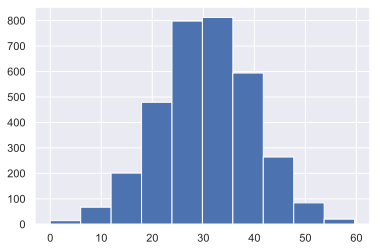

In [4]:
df['Total day charge'].hist()

In [5]:
features=['Total day charge','Total night charge']

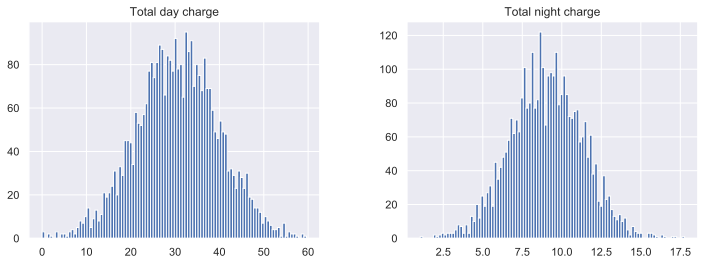

In [6]:
df[features].hist(figsize=(12,4), bins=100);

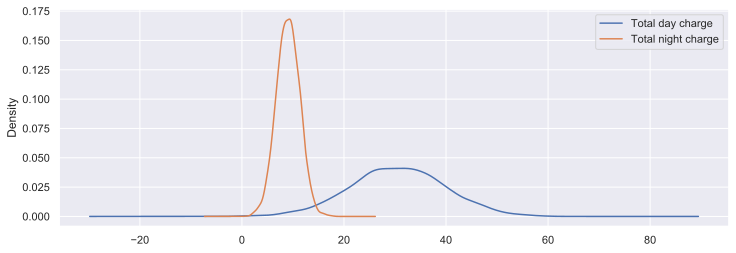

In [7]:
df[features].plot(kind='density',figsize=(12,4));

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x000001E2B111BAC8>,
      dtype=object)

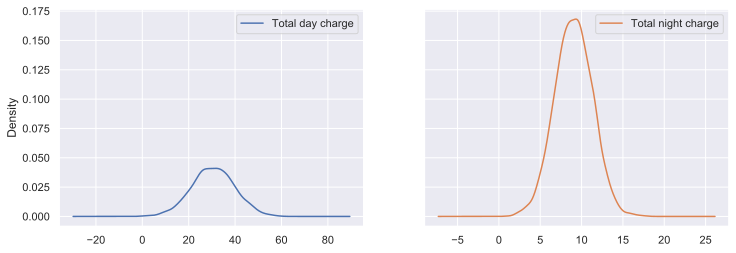

In [8]:
df[features].plot(kind='density',figsize=(12,4), subplots=True, layout=(1,2), sharey=True, sharex=False)

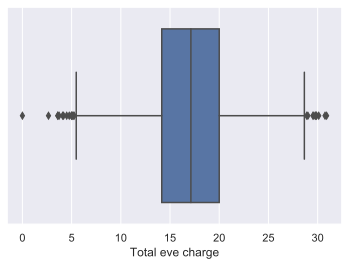

In [9]:
sns.boxplot(df['Total eve charge'])

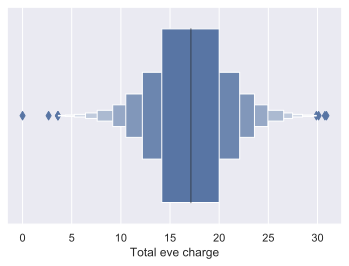

In [10]:
sns.boxenplot(df['Total eve charge'])

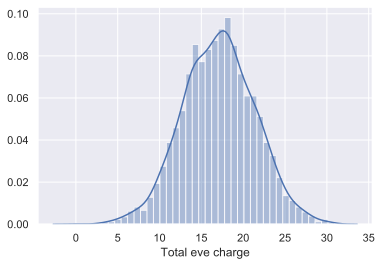

In [11]:
sns.distplot(df['Total eve charge'])

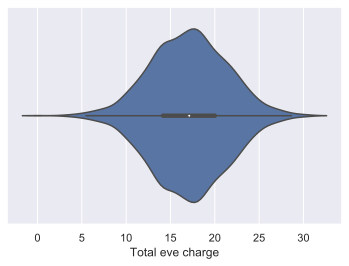

In [12]:
sns.violinplot(df['Total eve charge'])

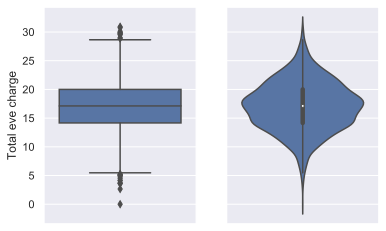

In [13]:
_, axes=plt.subplots(1,2, sharey=True, figsize=(6,4))
sns.boxplot(y=df['Total eve charge'], ax=axes[0])
sns.violinplot(y=df['Total eve charge'].values, ax=axes[1])

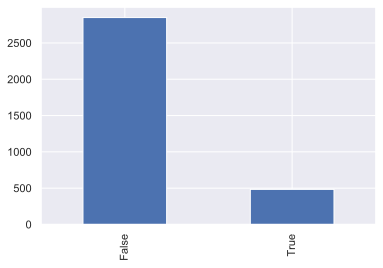

In [14]:
df.Churn.value_counts().plot.bar()

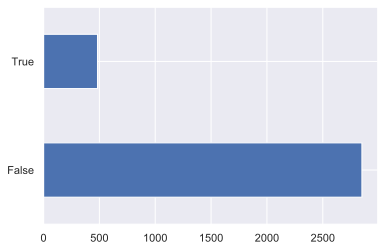

In [15]:
df.Churn.value_counts().plot.barh()

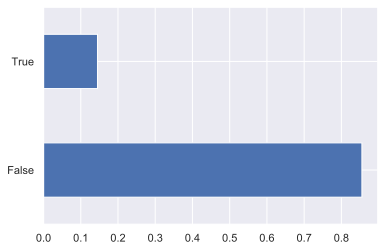

In [16]:
df.Churn.value_counts(normalize=True).plot.barh()

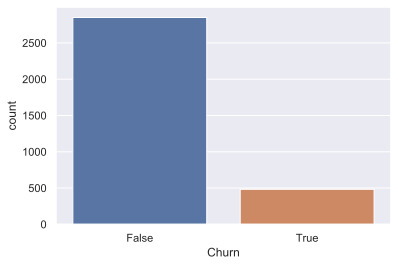

In [17]:
sns.countplot(df.Churn)

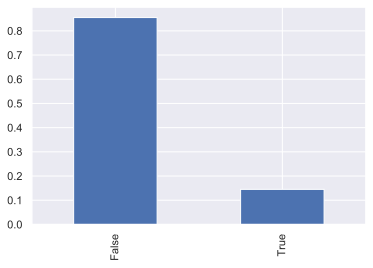

In [18]:
df.Churn.value_counts(normalize=True).plot(kind='bar', stacked=True)

In [19]:
features=['Churn','Customer service calls']

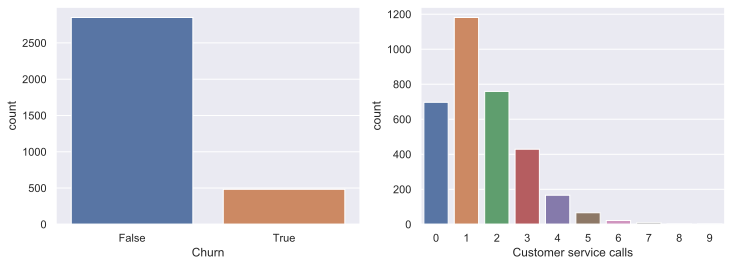

In [20]:
_, axes= plt.subplots(1,2, sharey=False, figsize=(12,4))
sns.countplot(df['Churn'], ax=axes[0])
sns.countplot(df['Customer service calls'], ax=axes[1])

# Multivariate Viz

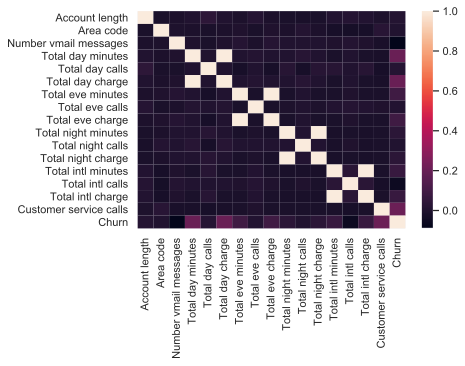

In [21]:
sns.heatmap(df.corr())

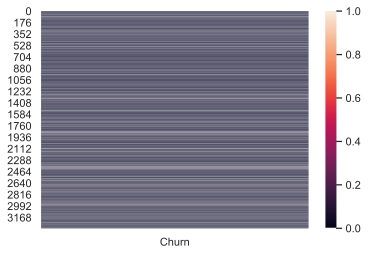

In [22]:
sns.heatmap(df[['Churn']])

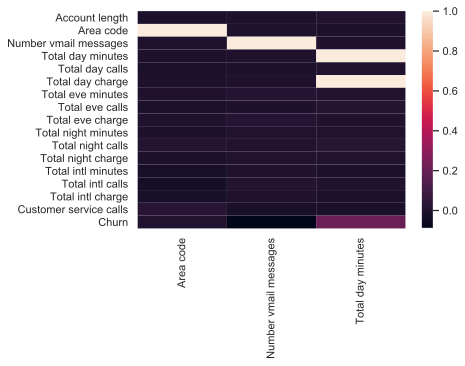

In [23]:
sns.heatmap(df.corr().iloc[:, 1:4])

In [24]:
df.nunique()

State                       51
Account length             212
Area code                    3
International plan           2
Voice mail plan              2
Number vmail messages       46
Total day minutes         1667
Total day calls            119
Total day charge          1667
Total eve minutes         1611
Total eve calls            123
Total eve charge          1440
Total night minutes       1591
Total night calls          120
Total night charge         933
Total intl minutes         162
Total intl calls            21
Total intl charge          162
Customer service calls      10
Churn                        2
dtype: int64

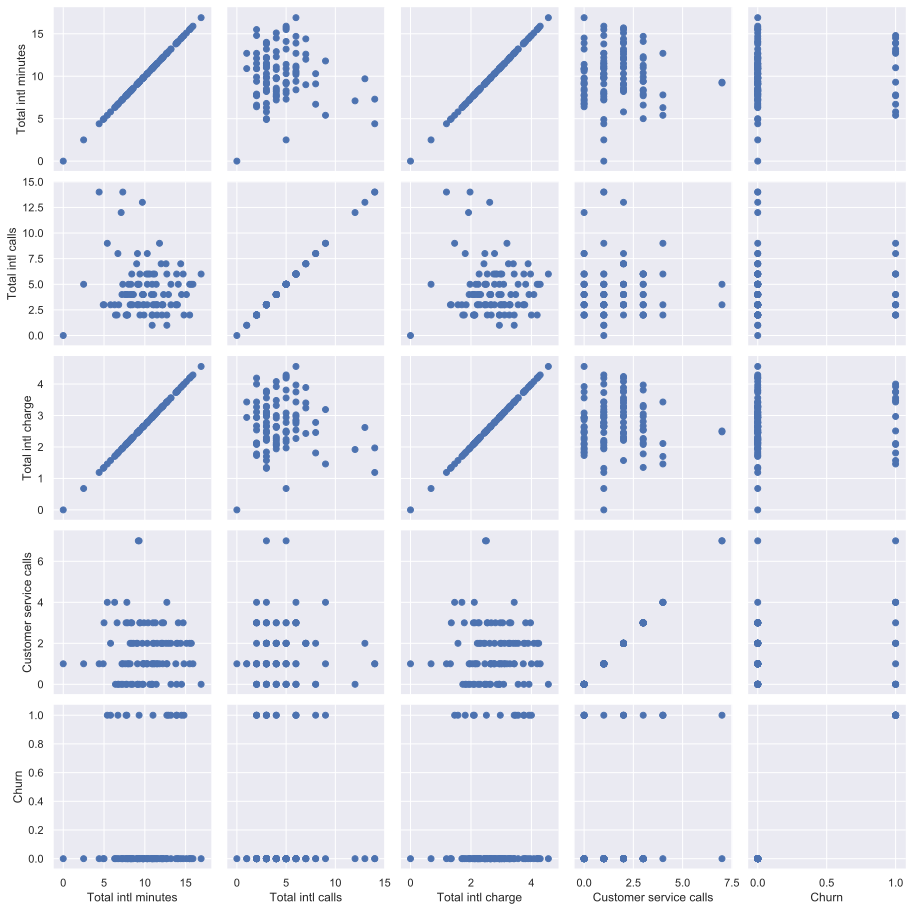

In [25]:
g=sns.PairGrid(df.iloc[:, -5:].sample(100))
g.map(plt.scatter)

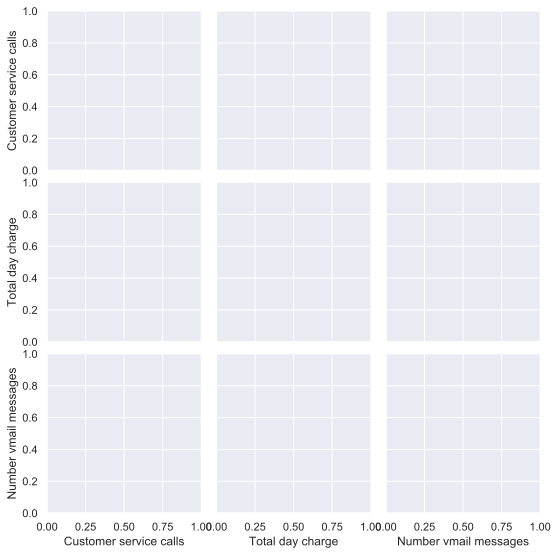

In [26]:
g=sns.PairGrid(df[['Customer service calls', 'Total day charge', 'Number vmail messages','Area code']], hue='Area code')

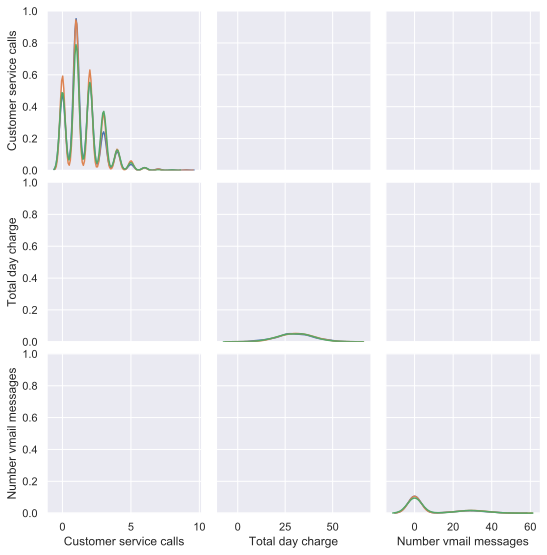

In [27]:
g=sns.PairGrid(df[['Customer service calls', 'Total day charge', 'Number vmail messages','Area code']], hue='Area code')
g.map_diag(sns.kdeplot)

In [28]:
g=sns.PairGrid(df[['Customer service calls', 'Total day charge', 'Number vmail messages','Area code']], hue='Area code')
g.map_diag(sns.kdeplot)
g.map_offdiag(sns.scatterplot)


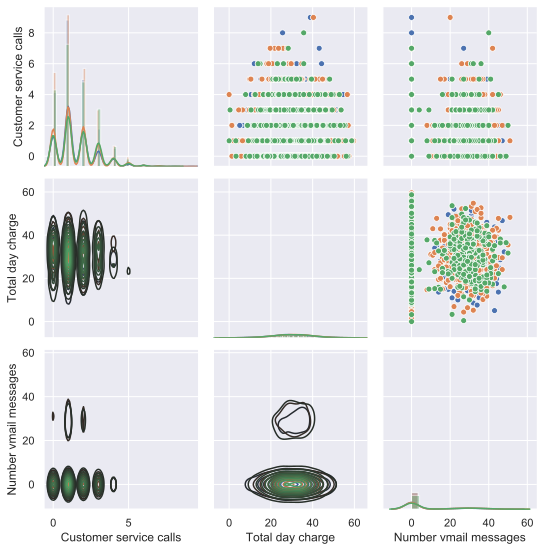

In [29]:
g=sns.PairGrid(df[['Customer service calls', 'Total day charge', 'Number vmail messages','Area code']], hue='Area code')
g.map_diag(sns.distplot)
g.map_upper(sns.scatterplot)
g.map_lower(sns.kdeplot)


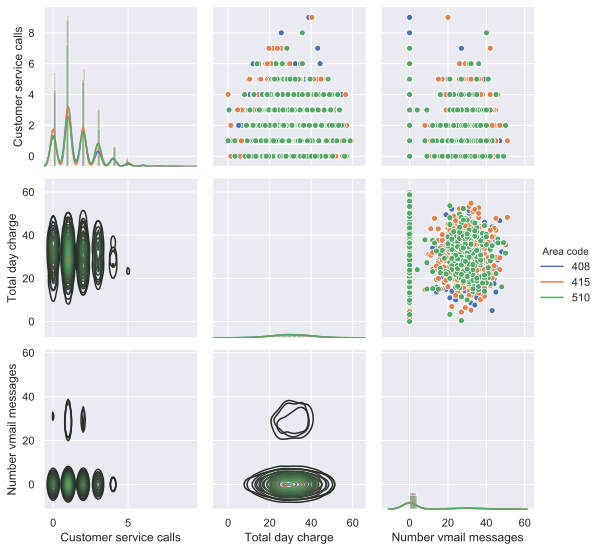

In [30]:
g=sns.PairGrid(df[['Customer service calls', 'Total day charge', 'Number vmail messages','Area code']], hue='Area code')
g.map_diag(sns.distplot)
g.map_upper(sns.scatterplot)
g.map_lower(sns.kdeplot)
g.add_legend()

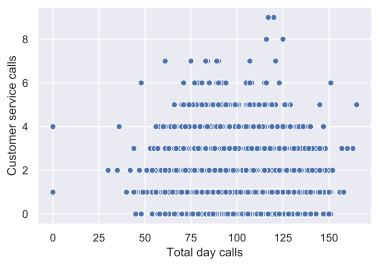

In [31]:
sns.scatterplot(df['Total day calls'], df['Customer service calls'])

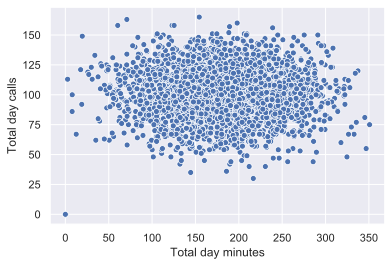

In [32]:
sns.scatterplot(df['Total day minutes'], df['Total day calls'])

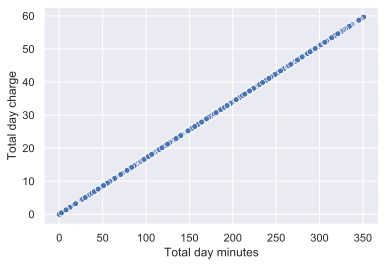

In [33]:
sns.scatterplot(df['Total day minutes'], df['Total day charge'])

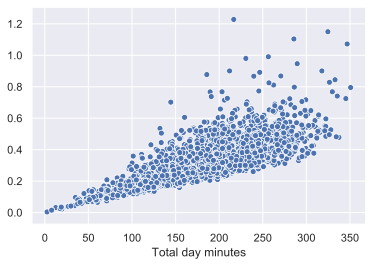

In [34]:
sns.scatterplot(df['Total day minutes'], df['Total day charge']/df['Total day calls'])

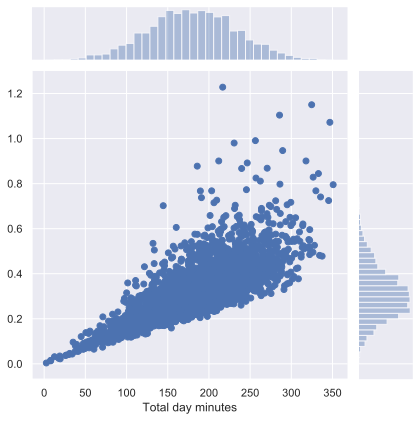

In [35]:
sns.jointplot(df['Total day minutes'], df['Total day charge']/df['Total day calls'])

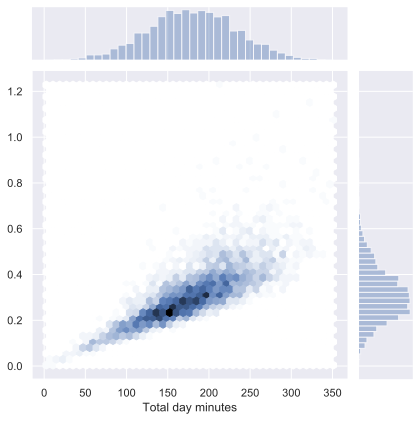

In [36]:
sns.jointplot(df['Total day minutes'], df['Total day charge']/df['Total day calls'], kind='hex')

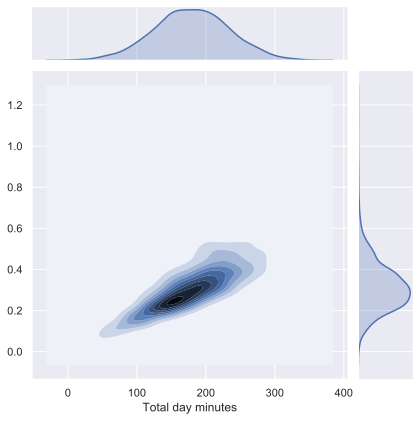

In [37]:
sns.jointplot(df['Total day minutes'], df['Total day charge']/df['Total day calls'], kind='kde')

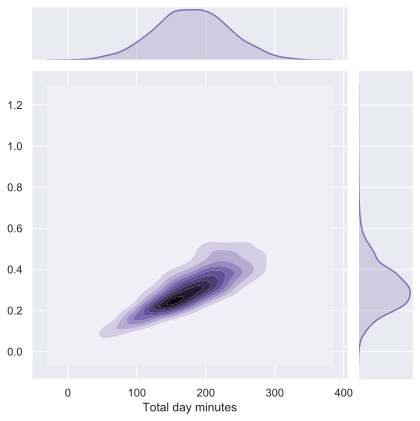

In [38]:
sns.jointplot(df['Total day minutes'], df['Total day charge']/df['Total day calls'], kind='kde', color='m')

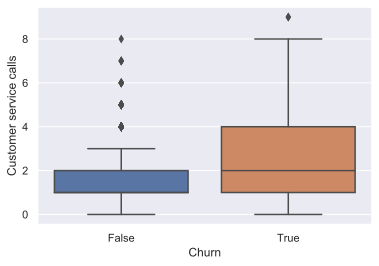

In [39]:
sns.boxplot('Churn','Customer service calls', data=df)

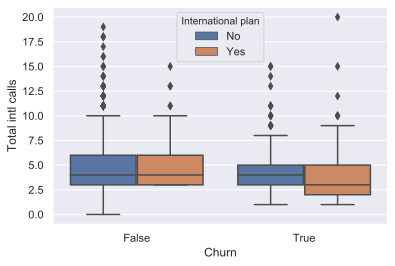

In [40]:
sns.boxplot(x='Churn',y='Total intl calls', data=df, hue='International plan')

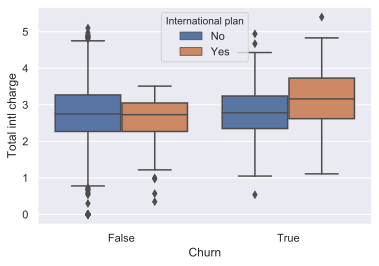

In [41]:
sns.boxplot(x='Churn',y='Total intl charge', data=df, hue='International plan')

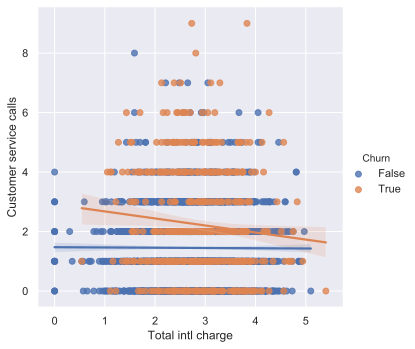

In [42]:
sns.lmplot(data=df, x='Total intl charge',y='Customer service calls', hue='Churn')

In [43]:
num_features=df._get_numeric_data().columns.drop('Area code')

IndexError: index 5 is out of bounds for axis 0 with size 5

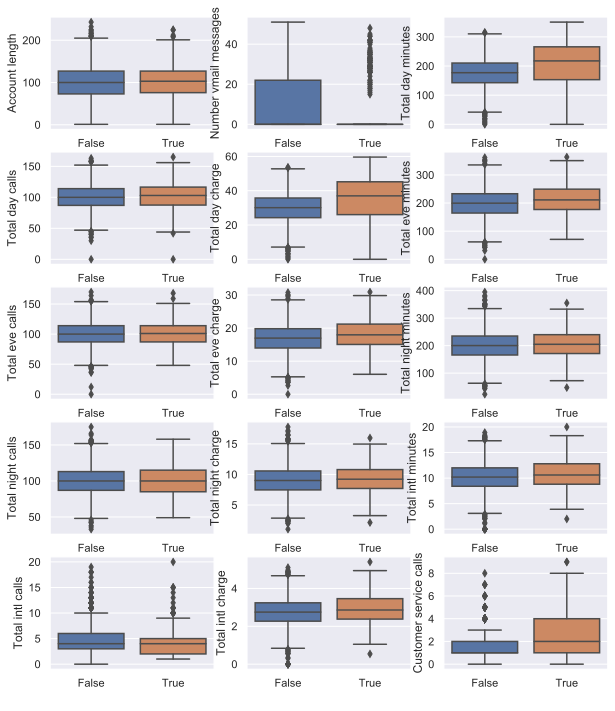

In [44]:
fig, axes=plt.subplots(5,3, figsize=(10,12))
for idx, feature in enumerate(num_features):
    ax=axes[idx//3,idx%3]
    sns.boxplot(x='Churn', y=feature, data=df, ax=ax)
    ax.set_xlabel(' ')
    ax.set_ylabel(feature)
fig.tight_layout();

In [ ]:
sns.factorplot(data=df, x='Churn', kind='box', y='Total day minutes', col='Customer service calls', col_wrap=2, size=5)

In [ ]:
sns.pointplot(x='Customer service calls', y='Total intl charge', hue='Churn', data=df, markers=['o','x'], linestyles=['-','--'])